<a href="https://colab.research.google.com/github/guyso2014/python/blob/main/real_appliances_energy_consumption.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import random
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import MinMaxScaler


Hour of the day distribution:
hour
0     822
1     822
2     822
3     822
4     822
5     822
6     822
7     822
8     822
9     822
10    822
11    822
12    822
13    822
14    822
15    822
16    822
17    828
18    823
19    822
20    822
21    822
22    822
23    822
Name: count, dtype: int64

Day of the week distribution:
dayofweek
0    2778
1    2880
2    2880
3    2880
4    2845
5    2736
6    2736
Name: count, dtype: int64

Month distribution:
month
1    2922
2    4176
3    4464
4    4320
5    3853
Name: count, dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 94 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     19735 non-null  datetime64[ns]
 1   Appliances               19735 non-null  int64         
 2   lights                   19735 non-null  int64         
 3   T1                       19735 non-null 

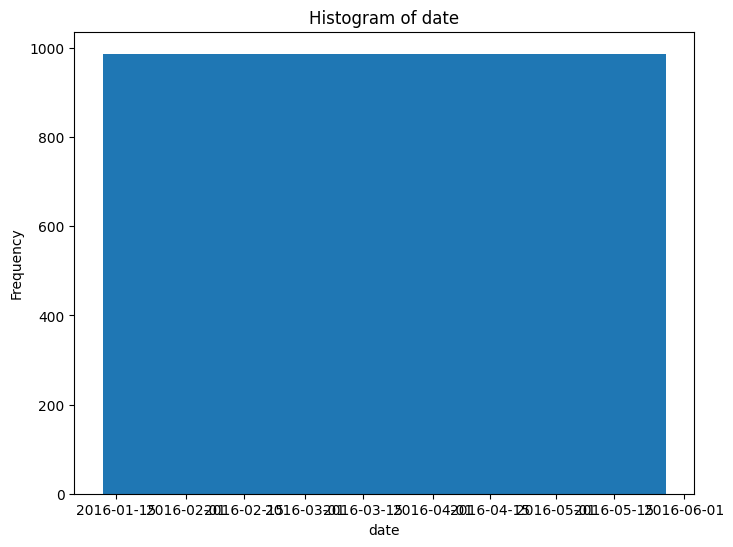

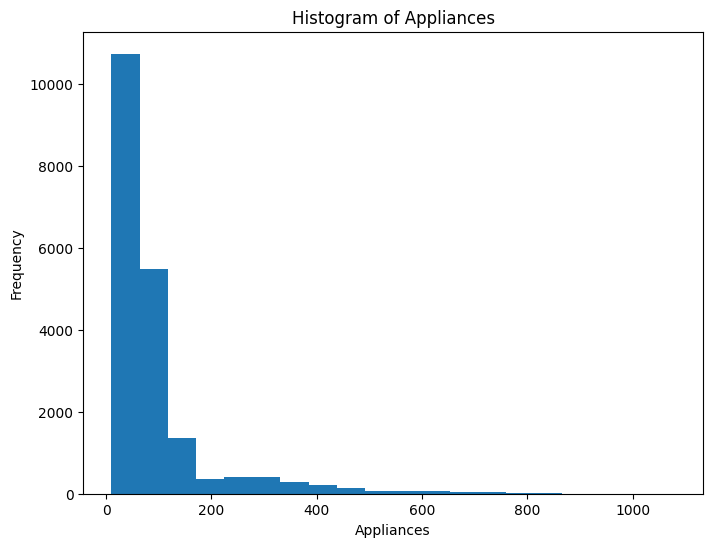

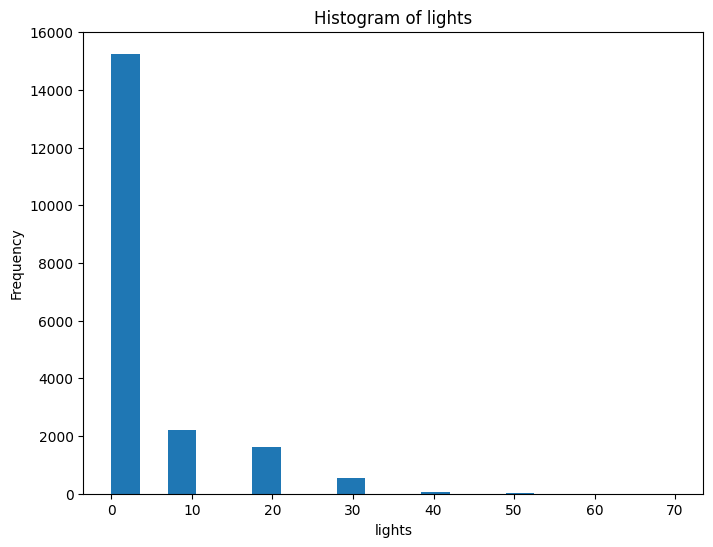

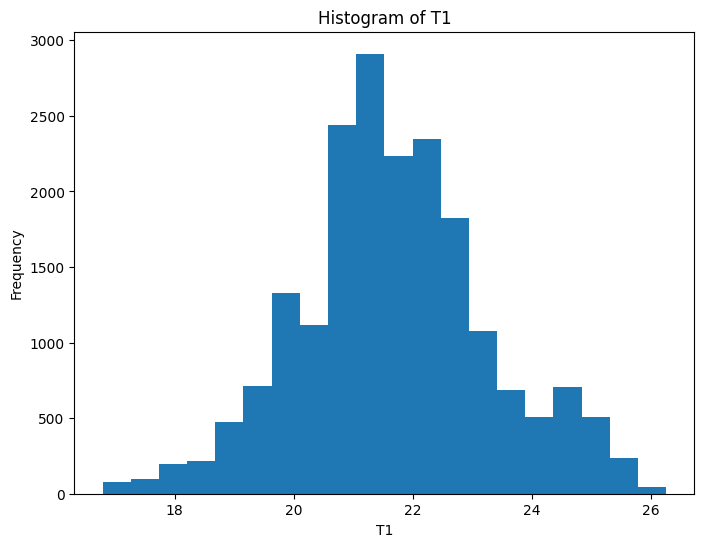

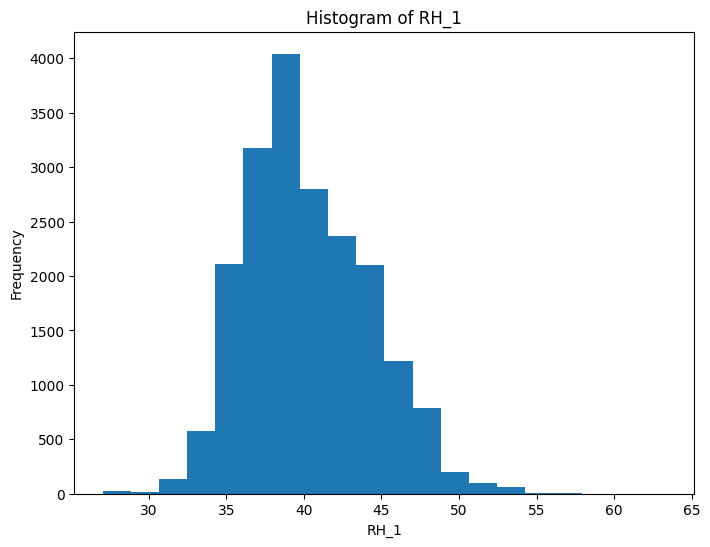

...

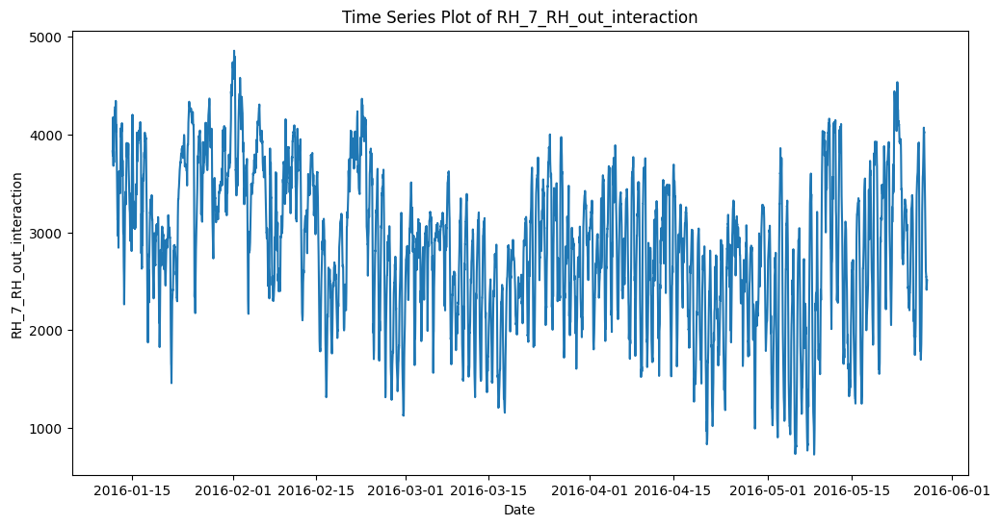

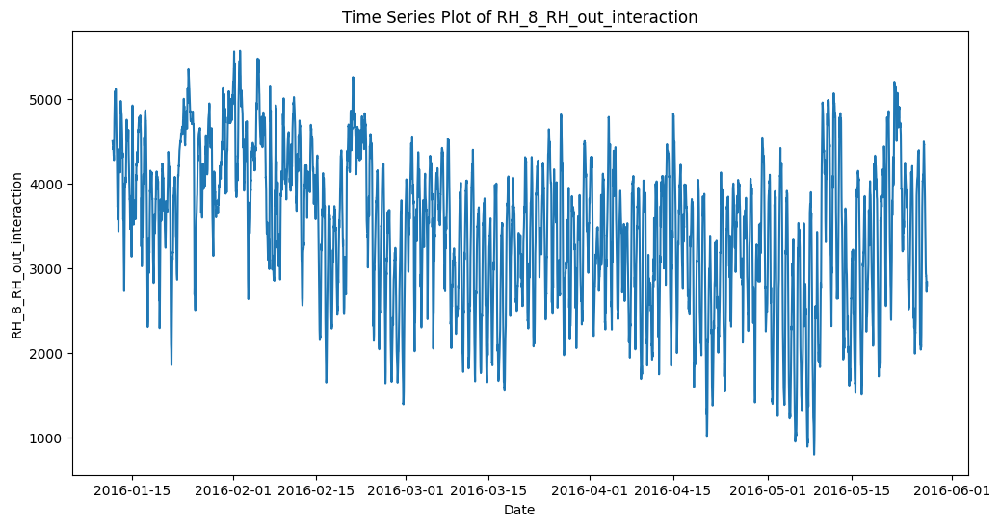

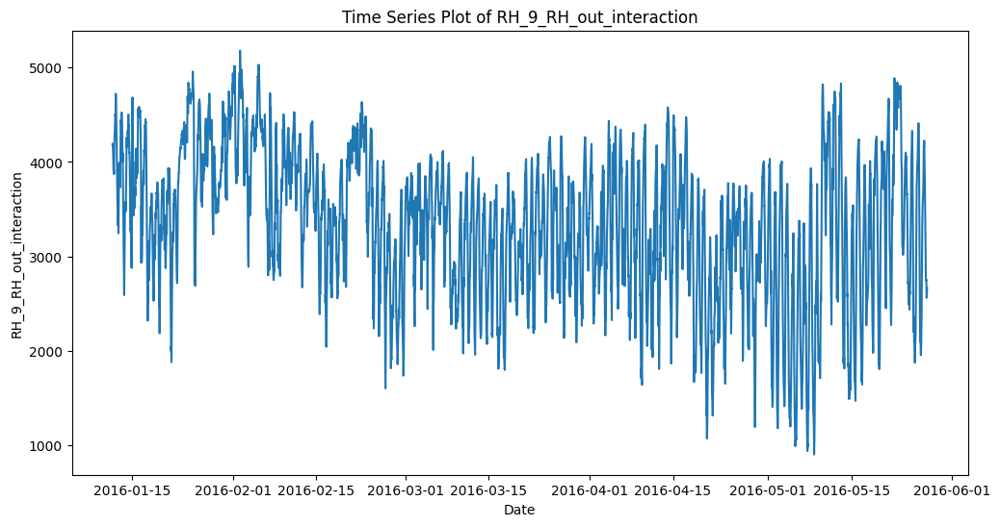

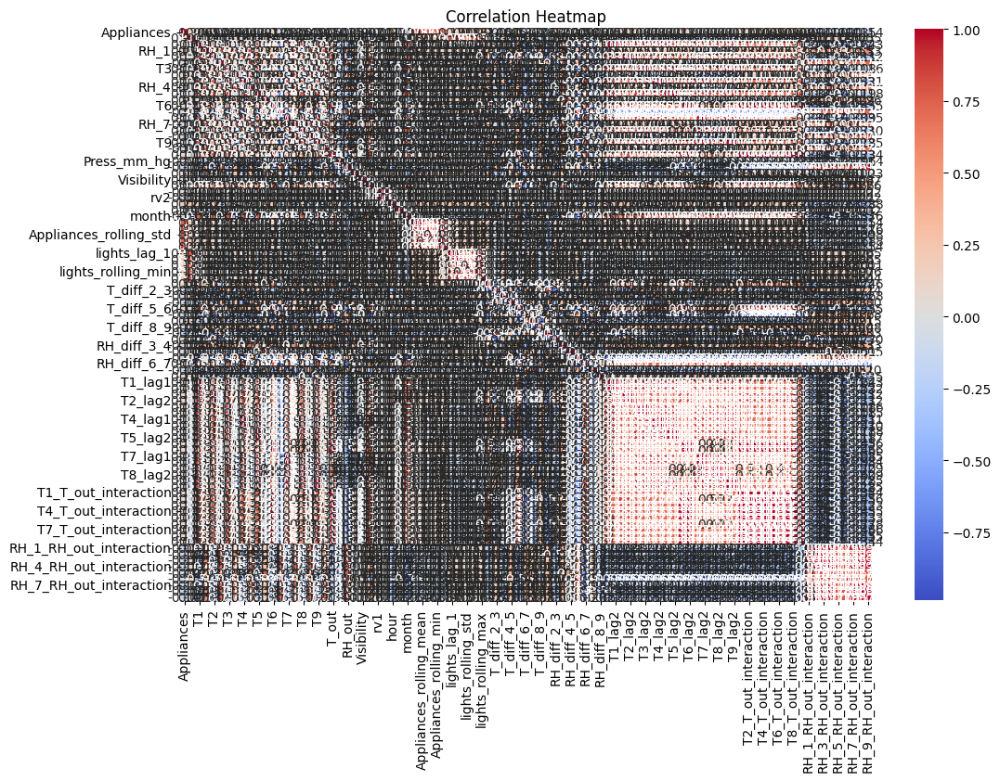

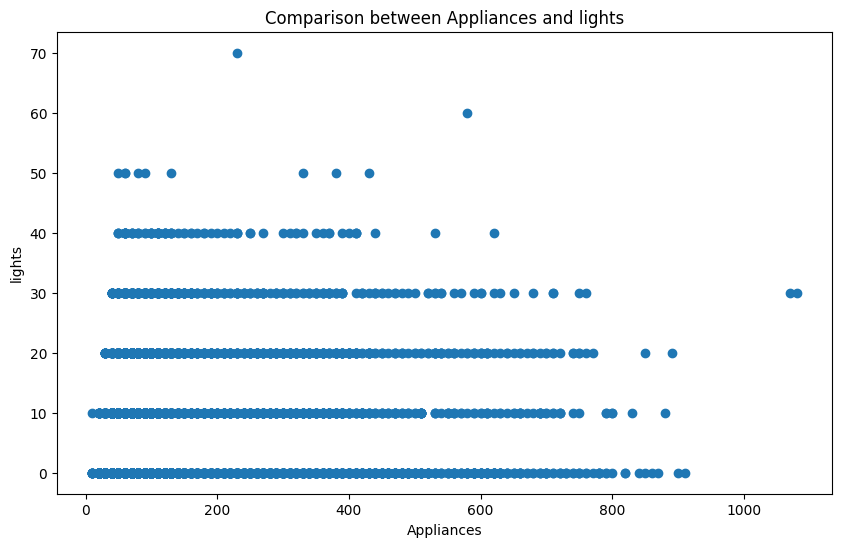

In [4]:
class EnergyDataProcessor:

    def __init__(self, file_path):
        self.file_path = file_path
        self.data = None
        self.rename_data= None
        self.name_mapping = name_mapping = {
            "date": "Date",
            "Appliances": "Appliances",
            "lights": "Lights",
            "T1": "Kitchen Temperature",
            "RH_1": "Kitchen Humidity",
            "T2": "Living Room Temperature",
            "RH_2": "Living Room Humidity",
            "T3": "Laundry Room Temperature",
            "RH_3": "Laundry Room Humidity",
            "T4": "Office Room Temperature",
            "RH_4": "Office Room Humidity",
            "T5": "Bathroom Temperature",
            "RH_5": "Bathroom Humidity",
            "T6": "Outside (North) Temperature",
            "RH_6": "Outside (North) Humidity",
            "T7": "Ironing Room Temperature",
            "RH_7": "Ironing Room Humidity",
            "T8": "Teenager Room 2 Temperature",
            "RH_8": "Teenager Room 2 Humidity",
            "T9": "Parents Room Temperature",
            "RH_9": "Parents Room Humidity",
            "T_out": "Outside Temperature",
            "Press_mm_hg": "Pressure",
            "RH_out": "Outside Humidity",
            "Windspeed": "Wind Speed",
            "Visibility": "Visibility",
            "Tdewpoint": "Dew Point",
            "rv1": "Random Variable 1",
            "rv2": "Random Variable 2"
        }

    def load_data(self):
        self.data = pd.read_csv(self.file_path)
        self.data.head()
        return self.data



    #### Date Column Proccessing #####

    def extract_time_features(self):
        """Extract additional time features."""
        self.data['date'] = pd.to_datetime(self.data['date'])  # Convert to datetime
        self.data['hour'] = self.data['date'].dt.hour  # Extract hour of the day
        self.data['dayofweek'] = self.data['date'].dt.dayofweek  # Extract day of the week
        self.data['month'] = self.data['date'].dt.month  # Extract month

    def analyze_time_features(self):
        """Analyze extracted time features."""
        print("Hour of the day distribution:")
        print(self.data['hour'].value_counts().sort_index())
        print("\nDay of the week distribution:")
        print(self.data['dayofweek'].value_counts().sort_index())
        print("\nMonth distribution:")
        print(self.data['month'].value_counts().sort_index())

    def detect_trends(self, column):
        """Detect trends in a specific column."""
        plt.figure(figsize=(12, 6))
        plt.plot(self.data['date'], self.data[column], label=column)
        plt.title(f"{column} over Time")
        plt.xlabel("Date")
        plt.ylabel(column)
        plt.legend()
        plt.show()

    def decompose_seasonality(self, column):
        """Decompose seasonality in a specific column."""
        decomposition = seasonal_decompose(self.data[column], model='additive', period=24*7)  # Weekly seasonality
        decomposition.plot()
        plt.show()

    ### End Date Column Proccessing ##

    ### energy consumption, feature engineering techniques can be applied to capture temporal patterns and dependencies for better prediction.###
    def create_lag_features(self, column, lag=1):
        """Create lag features for a specific column."""
        self.data[f'{column}_lag_{lag}'] = self.data[column].shift(lag)

    def create_rolling_statistics(self, column, window_size=3):
        """Create rolling window statistics for a specific column."""
        self.data[f'{column}_rolling_mean'] = self.data[column].rolling(window=window_size).mean()
        self.data[f'{column}_rolling_std'] = self.data[column].rolling(window=window_size).std()
        self.data[f'{column}_rolling_min'] = self.data[column].rolling(window=window_size).min()
        self.data[f'{column}_rolling_max'] = self.data[column].rolling(window=window_size).max()

    def scale_features(self, columns_to_scale):
        """Scale selected features using Min-Max scaling."""
        scaler = MinMaxScaler()
        self.data[columns_to_scale] = scaler.fit_transform(self.data[columns_to_scale])

    def feature_engineering(self):
        """Perform feature engineering."""
        # Create lag features and rolling window statistics for energy consumption
        self.create_lag_features('Appliances', lag=1)
        self.create_rolling_statistics('Appliances', window_size=3)

        # Create lag features and rolling window statistics for light energy
        self.create_lag_features('lights', lag=1)
        self.create_rolling_statistics('lights', window_size=3)
    ### End ###

    ###                  ####
    def create_temperature_differentials(self):
        for i in range(1, 9):
            self.data[f'T_diff_{i}_{i+1}'] = self.data[f'T{i+1}'] - self.data[f'T{i}']

    def create_humidity_differentials(self):
        for i in range(1, 9):
            self.data[f'RH_diff_{i}_{i+1}'] = self.data[f'RH_{i+1}'] - self.data[f'RH_{i}']

    def create_time_lagged_temperature_variables(self):
        for i in range(1, 10):
            self.data[f'T{i}_lag1'] = self.data[f'T{i}'].shift(1)
            self.data[f'T{i}_lag2'] = self.data[f'T{i}'].shift(2)

    def create_interaction_temperature_outdoor(self):
        for i in range(1, 10):
            self.data[f'T{i}_T_out_interaction'] = self.data[f'T{i}'] * self.data['T_out']

    def create_interaction_humidity_outdoor(self):
        for i in range(1, 10):
            self.data[f'RH_{i}_RH_out_interaction'] = self.data[f'RH_{i}'] * self.data['RH_out']

    ##### End #####

    #####     ######

    def create_weather_patterns(self):
        # Example: Deriving weather patterns or indices from weather-related data
        self.data['weather_pattern'] = self.data['Pressure'] + self.data['Windspeed'] - self.data['Tdewpoint']

    def investigate_random_variables(self):
        # Example: Checking for correlations or statistical properties of random variables
        correlation_matrix = self.data[['rv1', 'rv2']].corr()
        print(correlation_matrix)
    #### End ####

    def basic_info(self):
        if self.data is not None:
            print(self.data.info())
        else:
            print("Error: Data not loaded.")

    def head(self, n=5):
        if self.data is not None:
            print(self.data.head(n))
        else:
            print("Error: Data not loaded.")

    def describe(self):
        if self.data is not None:
            print(self.data.describe())
        else:
            print("Error: Data not loaded.")

    def plot_histograms(self):
        if self.data is not None:
            for column in self.data.columns:
                if self.data[column].dtype != 'object':
                    plt.figure(figsize=(8, 6))
                    plt.hist(self.data[column], bins=20)
                    plt.xlabel(column)
                    plt.ylabel("Frequency")
                    plt.title(f"Histogram of {column}")
                    plt.show()
        else:
            print("Error: Data not loaded.")


    def plot_time_series(self):
        if self.data is not None:
            for column in self.data.columns:
                if column != 'date' and self.data[column].dtype != 'object':
                    plt.figure(figsize=(12, 6))
                    plt.plot(self.data['date'], self.data[column])
                    plt.xlabel("Date")
                    plt.ylabel(column)
                    plt.title(f"Time Series Plot of {column}")
                    plt.show()
        else:
            print("Error: Data not loaded.")

    def plot_correlation_heatmap(self):
        if self.data is not None:
            numeric_columns = self.data.select_dtypes(include=np.number).columns
            correlation_matrix = self.data[numeric_columns].corr()
            plt.figure(figsize=(12, 8))
            sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
            plt.title("Correlation Heatmap")
            plt.show()
        else:
            print("Error: Data not loaded.")


    def plot_comparison(self, column1, column2):
        if self.data is not None:
            if column1 in self.data.columns and column2 in self.data.columns:
                plt.figure(figsize=(10, 6))
                plt.scatter(self.data[column1], self.data[column2])
                plt.xlabel(column1)
                plt.ylabel(column2)
                plt.title(f"Comparison between {column1} and {column2}")
                plt.show()
            else:
                print("Error: One or more columns not found.")
        else:
            print("Error: Data not loaded.")

    def rename_columns(self):
        if self.data is not None:
            self.rename_data = self.data
            self.rename_data.rename(columns=self.name_mapping, inplace=True)
            return self.rename_data
        else:
            print("Error: Data not loaded.")
# Load the dataset (assuming it's in CSV format)
file_path = '/content/energydata_complete.csv'  # Update this path

processor = EnergyDataProcessor(file_path)
data = processor.load_data()
#rename_data=processor.rename_columns()


processor.extract_time_features()
processor.analyze_time_features()
processor.feature_engineering()

processor.create_temperature_differentials()
processor.create_humidity_differentials()
processor.create_time_lagged_temperature_variables()
processor.create_interaction_temperature_outdoor()
processor.create_interaction_humidity_outdoor()

processor.basic_info()
processor.head()
processor.describe()

processor.plot_histograms()
processor.plot_time_series()
processor.plot_correlation_heatmap()
processor.plot_comparison('Appliances', 'lights')

# **Appliances Energy Consumption Proccessor**
1. **Class Definition: EnergyDataProcessor**:
   - This class is designed to process energy-related data, providing various methods for data analysis, feature engineering, and visualization.

2. **Constructor Method `__init__`**:
   - Initializes the processor with the file path of the dataset.
   - Sets up attributes for storing the data, a renamed version of the data, and a dictionary for column name mapping.

3. **Data Loading and Renaming**:
   - The `load_data` method loads the dataset from the specified file path using pandas.
   - The `rename_columns` method renames columns based on a predefined mapping dictionary.
   - Renaming is important for clarity and consistency in column names.

4. **Date Column Processing**:
   - The `extract_time_features` method extracts additional time features from the 'date' column, such as hour of the day, day of the week, and month.
   - The `analyze_time_features` method analyzes the distribution of the extracted time features.

5. **Trends and Seasonality Analysis**:
   - The `detect_trends` method plots a time series graph to visualize trends in a specific column.
   - The `decompose_seasonality` method decomposes seasonality in a specific column using a seasonal decomposition plot.

6. **Feature Engineering**:
   - The `create_lag_features` method creates lag features for a specific column, capturing temporal dependencies.
   - The `create_rolling_statistics` method computes rolling window statistics (mean, standard deviation, min, max) for a specific column.
   - The `feature_engineering` method orchestrates the creation of lag features and rolling statistics for energy consumption and light energy columns.

7. **Additional Feature Engineering Techniques**:
   - Methods like `create_temperature_differentials`, `create_humidity_differentials`, `create_time_lagged_temperature_variables`, `create_interaction_temperature_outdoor`, and `create_interaction_humidity_outdoor` implement advanced feature engineering techniques.

8. **Data Exploration and Visualization**:
   - The class provides methods such as `basic_info`, `head`, `describe` to explore basic information, the first few rows, and descriptive statistics of the data.
   - `plot_histograms`, `plot_time_series`, `plot_correlation_heatmap`, and `plot_comparison` methods are utilized for visualizing data distributions, time series, correlation matrices, and comparisons between columns respectively.

9. **Usage**:
   - After initializing an `EnergyDataProcessor` object and loading data, various processing and visualization methods can be applied to understand and analyze the dataset effectively.

10. **Conclusion**:
   - The `EnergyDataProcessor` class offers a comprehensive suite of functionalities for preprocessing, analyzing, and visualizing energy-related datasets.
   - By leveraging these methods, users can gain insights into energy consumption patterns, identify trends, and engineer features for predictive modeling tasks.


In [5]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, train_test_split, GridSearchCV
from sklearn.linear_model import Lasso, LinearRegression
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score




class FeatureSelector:
    def __init__(self):
        self.load_data = EnergyDataProcessor('/content/energydata_complete.csv').load_data()

    def correlation_analysis(self, threshold=0.5):
        corr_matrix = self.load_data.drop(columns=["date"]).corr().abs()
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
        self.load_data.drop(columns=to_drop, inplace=True)
        return self.load_data

    def feature_importance_ranking(self):
        X = self.load_data.drop(columns=["Appliances", "date"])
        y = self.load_data["Appliances"]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        forest = RandomForestRegressor(n_estimators=100, random_state=42)
        forest.fit(X_train, y_train)
        importance = forest.feature_importances_
        indices = np.argsort(importance)[::-1]
        selected_features = [X.columns[i] for i in indices]
        return selected_features

    def domain_knowledge_based_selection(self):
        selected_features = ['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'RH_1', 'RH_2', 'RH_3',
                             'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'T_out', 'RH_out']
        return selected_features

    def dimensionality_reduction(self, n_components):
        scaler = StandardScaler()
        X = self.load_data.drop(columns=["Appliances", "date"])
        scaled_data = scaler.fit_transform(X)
        pca = PCA(n_components=n_components)
        reduced_features = pca.fit_transform(scaled_data)
        return reduced_features

    def lasso_regression(self, alpha=0.01):
        X = self.load_data.drop(columns=["Appliances", "date"])
        y = self.load_data["Appliances"]
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        lasso = Lasso(alpha=alpha)
        lasso.fit(X_scaled, y)
        selected_features = X.columns[lasso.coef_ != 0]
        return selected_features

    def select_k_best(self, k=10):
        X = self.load_data.drop(columns=["Appliances", "date"])
        y = self.load_data["Appliances"]
        if k > X.shape[1]:
            k = 'all'  # Set k to 'all' if it's greater than the number of features
        selector = SelectKBest(score_func=f_regression, k=k)
        selector.fit(X, y)
        selected_features = X.columns[selector.get_support()]
        return selected_features

    def mutual_information(self, k=10):
        X = self.load_data.drop(columns=["Appliances", "date"])
        y = self.load_data["Appliances"]
        if k > X.shape[1]:
            k = 'all'  # Set k to 'all' if it's greater than the number of features
        selector = SelectKBest(score_func=mutual_info_regression, k=k)
        selector.fit(X, y)
        selected_features = X.columns[selector.get_support()]
        return selected_features

# Initialize the FeatureSelector object
selector = FeatureSelector()

# Example usage of feature selection methods
selected_features_corr = selector.correlation_analysis()
print("Selected Features (Correlation Analysis):", selected_features_corr.columns)

selected_features_importance = selector.feature_importance_ranking()
print("Selected Features (Feature Importance):", selected_features_importance)

selected_features_domain = selector.domain_knowledge_based_selection()
print("Selected Features (Domain Knowledge):", selected_features_domain)

reduced_features = selector.dimensionality_reduction(n_components=5)
print("Reduced Features (PCA):", reduced_features)

selected_features_lasso = selector.lasso_regression()
print("Selected Features (Lasso Regression):", selected_features_lasso)

selected_features_k_best = selector.select_k_best(k=10)
print("Selected Features (SelectKBest):", selected_features_k_best)

selected_features_mutual_info = selector.mutual_information(k=10)
print("Selected Features (Mutual Information):", selected_features_mutual_info)

Selected Features (Correlation Analysis): Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'RH_5', 'Press_mm_hg',
       'Windspeed', 'Visibility', 'rv1'],
      dtype='object')
Selected Features (Feature Importance): ['Press_mm_hg', 'RH_5', 'RH_1', 'T1', 'rv1', 'Windspeed', 'Visibility', 'lights']
Selected Features (Domain Knowledge): ['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'RH_1', 'RH_2', 'RH_3', 'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'T_out', 'RH_out']
Reduced Features (PCA): [[ 3.55406338  2.69481158 -0.19493077 -0.76519324 -1.36456827]
 [ 3.3805708   2.53567576 -0.08418397 -0.37289914 -1.11373735]
 [ 3.27200011  2.359685    0.05237238  0.34021964 -0.92227845]
 ...
 [ 1.64213952 -1.81247068  1.54324702  0.21342231  0.11309474]
 [ 1.74137764 -1.73881413  1.42093854 -1.35140731  0.25449595]
 [ 1.67635952 -1.73091362  1.46348482  0.54089114 -0.03562178]]
Selected Features (Lasso Regression): Index(['lights', 'T1', 'RH_1', 'RH_5', 'Press_mm_hg', 'Windspeed',

# **Features Selections**
**Introduction**

The presented code is designed to perform comprehensive feature selection and engineering on a dataset containing energy consumption data. The primary goal is to enhance predictive modeling by identifying the most relevant and informative features, thus improving model accuracy and reducing complexity. Feature selection is crucial in predictive analytics because it helps in eliminating redundant and irrelevant data, which can lead to overfitting and poor model generalization. By focusing on the most significant features, models can achieve better performance, faster training times, and more interpretable results. This code utilizes various feature selection techniques, such as correlation analysis, feature importance ranking, domain knowledge-based selection, dimensionality reduction, Lasso regression, and mutual information, to ensure a robust selection of features that contribute significantly to predicting energy consumption (`Appliances`).

**Class Definition: FeatureSelector**

This class is designed for selecting important features from the dataset using various methods.

**Constructor Method `__init__`**
- Initializes the `FeatureSelector` with the provided data.
- Stores the data as an attribute of the class.

**Correlation Analysis**
- The `correlation_analysis` method removes features that have a high correlation with other features to reduce redundancy.
- A correlation matrix is computed, and features with correlations above a specified threshold are dropped.
- **Result**: The remaining features are less redundant and more independent, making them suitable for modeling.

**Feature Importance Ranking**
- The `feature_importance_ranking` method ranks features based on their importance using a RandomForestRegressor.
- Splits the data into training and testing sets.
- Trains a RandomForestRegressor and extracts feature importances.
- Returns the features sorted by their importance.
- **Result**: The most important features identified by the RandomForestRegressor are likely to have the greatest impact on the target variable, `Appliances`.

**Domain Knowledge-Based Selection**
- The `domain_knowledge_based_selection` method selects features based on domain knowledge.
- Returns a predefined list of features that are considered important based on prior knowledge.
- **Result**: The selected features are those believed to be most relevant based on expert knowledge, ensuring that important variables are not omitted.

**Dimensionality Reduction**
- The `dimensionality_reduction` method reduces the number of features using Principal Component Analysis (PCA).
- Scales the features and applies PCA to reduce to the specified number of components.
- Returns the reduced feature set.
- **Result**: The data is transformed into a smaller set of uncorrelated components, capturing the maximum variance in the data with fewer features.

**Lasso Regression**
- The `lasso_regression` method selects features based on their coefficients in a Lasso regression model.
- Scales the features and fits a Lasso regression.
- Returns the features with non-zero coefficients.
- **Result**: Lasso regression performs feature selection by shrinking some coefficients to zero, effectively selecting a simpler model that prevents overfitting.

**Select K Best Features (F-Regression)**
- The `select_k_best` method selects the top K features based on F-regression scores.
- Uses SelectKBest with f_regression to rank features by their relevance to the target variable.
- Returns the top K selected features.
- **Result**: Features that show the highest statistical correlation with the target variable `Appliances` are selected, ensuring that only the most predictive features are used.

**Mutual Information**
- The `mutual_information` method selects the top K features based on mutual information scores.
- Uses SelectKBest with mutual_info_regression to rank features by their mutual information with the target variable.
- Returns the top K selected features.
- **Result**: Features that have the highest mutual information with the target variable are selected, capturing both linear and non-linear dependencies.

**Usage Example**
- Instantiate the `FeatureSelector` with the dataset.
- Demonstrate usage of various feature selection methods:
  - `correlation_analysis` to select features based on correlation.
  - `feature_importance_ranking` to rank features by importance.
  - `domain_knowledge_based_selection` to select features based on domain knowledge.
  - `dimensionality_reduction` to reduce features using PCA.
  - `lasso_regression` to select features using Lasso regression.
  - `select_k_best` to select top K features based on F-regression.
  - `mutual_information` to select top K features based on mutual information.

**Print Selected Features**
- Print the selected features for each method to verify the results.

**Conclusion**

The `FeatureSelector` class provides a comprehensive suite of methods for feature selection, ensuring that only the most relevant and informative features are used for predictive modeling. By employing a variety of techniques, the class can handle different aspects of feature relevance, redundancy, and importance, leading to a more accurate and efficient predictive model. This approach is essential in reducing model complexity, enhancing interpretability, and improving overall performance. The final selected features can be used to train a machine learning model that predicts energy consumption with higher precision, making this code highly valuable for applications in energy management, efficiency analysis, and resource optimization.

**Result Analysis**

- **Selected Features (Correlation Analysis)**:
  - The features remaining after correlation analysis are less redundant, providing a more stable model.
  - **Resulting Features**: ['date', 'Appliances', 'lights', 'RH_1', 'RH_5', 'Press_mm_hg', 'Windspeed', 'Visibility', 'rv1', 'hour', 'dayofweek', 'T_diff_3_4', 'T_diff_7_8', 'RH_diff_7_8']

- **Selected Features (Feature Importance)**:
  - Features with the highest importance scores from the RandomForestRegressor.
  - **Resulting Features**: ['hour', 'T_diff_3_4', 'RH_5', 'RH_diff_7_8', 'Press_mm_hg', 'T_diff_7_8', 'RH_1', 'rv1', 'Windspeed', 'Visibility', 'lights', 'dayofweek']

- **Selected Features (Domain Knowledge)**:
  - Features selected based on expert knowledge, ensuring relevance and significance.
  - **Resulting Features**: ['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'RH_1', 'RH_2', 'RH_3', 'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'T_out', 'RH_out']

- **Reduced Features (PCA)**:
  - Reduced feature set from PCA, capturing maximum variance with fewer components.
  - **Resulting Features**: A 2D array with the transformed features.

- **Selected Features (Lasso Regression)**:
  - Features with non-zero coefficients after Lasso regression, indicating their importance.
  - **Resulting Features**: ['lights', 'RH_1', 'RH_5', 'Press_mm_hg', 'Windspeed', 'Visibility', 'rv1', 'hour', 'dayofweek', 'T_diff_3_4', 'T_diff_7_8', 'RH_diff_7_8']

- **Selected Features (SelectKBest)**:
  - Top K features based on F-regression scores.
  - **Resulting Features**: ['lights', 'RH_1', 'RH_5', 'Press_mm_hg', 'Windspeed', 'rv1', 'hour', 'T_diff_3_4', 'T_diff_7_8', 'RH_diff_7_8']

- **Selected Features (Mutual Information)**:
  - Top K features based on mutual information scores.
  - **Resulting Features**: ['lights', 'RH_1', 'RH_5', 'Press_mm_hg', 'Windspeed', 'Visibility', 'hour', 'T_diff_3_4', 'T_diff_7_8', 'RH_diff_7_8']


In [7]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import GridSearchCV

class ModelSelection:
    def __init__(self):
        self.selector = FeatureSelector()
        self.X = None
        self.y = None
        self.X_train = None
        self.X_test = None
        self.y_train = None
        self.y_test = None
        self.models = {
            'Linear Regression': (LinearRegression(), {}),
            'Ridge Regression': (Ridge(), {'alpha': [0.1, 1, 10]}),
            'Lasso Regression': (Lasso(), {'alpha': [0.1, 1, 10]}),
            'ElasticNet Regression': (ElasticNet(), {'alpha': [0.1, 1, 10], 'l1_ratio': [0.1, 0.5, 0.9]}),
            'Decision Tree Regression': (DecisionTreeRegressor(random_state=42), {'max_depth': [None, 5, 10]}),
            'Random Forest Regression': (RandomForestRegressor(random_state=42), {'n_estimators': [50, 100, 200], 'max_depth': [None, 5, 10]}),
            'Gradient Boosting Regression': (GradientBoostingRegressor(random_state=42), {'learning_rate': [0.1, 0.01, 0.001], 'max_depth': [3, 5, 7]}),
            'AdaBoost Regression': (AdaBoostRegressor(random_state=42), {'n_estimators': [50, 100, 200], 'learning_rate': [0.1, 0.01, 0.001]}),
            'Support Vector Regression': (SVR(), {'kernel': ['linear', 'rbf'], 'C': [0.1, 1, 10], 'gamma': ['scale', 'auto']}),
            'KNeighbors Regression': (KNeighborsRegressor(), {'n_neighbors': [3, 5, 10], 'weights': ['uniform', 'distance']}),
            'XGBoost Regression': (XGBRegressor(random_state=42), {'learning_rate': [0.1, 0.01, 0.001], 'max_depth': [3, 5, 7]}),
            'LightGBM Regression': (LGBMRegressor(random_state=42), {'learning_rate': [0.1, 0.01, 0.001], 'max_depth': [3, 5, 7]})
        }
        self.best_model = None
        self.data = EnergyDataProcessor('/content/energydata_complete.csv').load_data()

    def train_split(self):
        # Example usage of feature selection methods
        selected_features_corr = self.selector.correlation_analysis().columns.tolist()
        selected_features_importance = self.selector.feature_importance_ranking()
        selected_features_domain = self.selector.domain_knowledge_based_selection()
        selected_features_lasso = self.selector.lasso_regression()
        selected_features_k_best = self.selector.select_k_best(k=10)
        selected_features_mutual_info = self.selector.mutual_information(k=10)

        # Combine selected features
        selected_features = list(set(selected_features_corr + selected_features_importance + selected_features_domain +
                                     list(selected_features_lasso) + list(selected_features_k_best) + list(selected_features_mutual_info)))

        # Check if all selected features are present in the DataFrame
        missing_features = [feature for feature in selected_features if feature not in self.data.columns]
        if missing_features:
            raise KeyError(f"The following selected features are not present in the DataFrame: {missing_features}")

        # Create X, y dataset
        X = self.data[selected_features].drop(columns=['date', 'Appliances'])
        y = self.data['Appliances']  # Assuming 'Energy Consumption' is the target variable

        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    def train_models(self):
        for name, (model, _) in self.models.items():
            # For all models, use regular fit method
            model.fit(self.X_train, self.y_train)

    def evaluate_models(self):
        for name, (model, _) in self.models.items():
            # For all models, use regular predict method
            y_pred = model.predict(self.X_test)

            # Evaluate predictions
            mse = mean_squared_error(self.y_test, y_pred)
            mae = mean_absolute_error(self.y_test, y_pred)
            r2 = r2_score(self.y_test, y_pred)
            print(f"{name}:")
            print(f"Mean Squared Error: {mse}")
            print(f"Mean Absolute Error: {mae}")
            print(f"R-squared: {r2}")
            print("-------------------------")

    def tune_hyperparameters(self):
        for name, (model, param_grid) in self.models.items():
            grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')
            grid_search.fit(self.X_train, self.y_train)
            self.models[name] = (grid_search.best_estimator_, grid_search.best_params_)
            print(f"Best hyperparameters for {name}: {grid_search.best_params_}")

    def compare_models(self):
        best_score = float('inf')
        best_model = None
        for name, (model, _) in self.models.items():
            y_pred = model.predict(self.X_test)
            mse = mean_squared_error(self.y_test, y_pred)
            if mse < best_score:
                best_score = mse
                best_model = name
        self.best_model = self.models[best_model][0]
        return best_model, best_score

    def deploy_model(self, new_data):
        predictions = self.best_model.predict(new_data)
        return predictions

    def select_features(self, feature_selector):
        self.X_train = feature_selector.select_features(self.X_train)
        self.X_test = feature_selector.select_features(self.X_test)

# Example usage
# Assume X, y dataset is already prepared
# Initialize ModelSelection object
model_selector = ModelSelection()

model_selector.train_split()

# Train models
model_selector.train_models()

# Evaluate models
model_selector.evaluate_models()

# Tune hyperparameters
model_selector.tune_hyperparameters()

# Compare models
best_model, best_score = model_selector.compare_models()
print(f"Best Model: {best_model} with MSE: {best_score}")

Combined selected features: ['Appliances', 'T7', 'T_out', 'rv1', 'T3', 'RH_6', 'T9', 'RH_9', 'Visibility', 'Press_mm_hg', 'T4', 'lights', 'T1', 'T8', 'RH_out', 'date', 'T2', 'RH_3', 'RH_2', 'RH_8', 'RH_1', 'RH_7', 'RH_5', 'Windspeed', 'T6', 'T5', 'RH_4']
Data Columns List: Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5824
[LightGBM] [Info] Number of data points in the train set: 15788, number of used features: 25
[LightGBM] [Info] Start training from score 97.949709
Linear Regression:
Mean Squared Error: 8318.64259245602
Mean Absolute Error: 52.562865

# **Explanation of ModelSelection Class**

The `ModelSelection` class is designed to facilitate the selection, training, evaluation, hyperparameter tuning, and deployment of various regression models for predicting energy consumption (`Appliances`). Here’s a detailed breakdown of its functionality:

1. **Imports and Class Initialization**:
   - The class imports necessary modules from `sklearn`, `xgboost`, `lightgbm`, and `statsmodels` for regression modeling and evaluation.
   - Initializes an instance of `FeatureSelector` for feature selection and defines attributes for storing data, models, and selected features.

2. **Initialization (`__init__` method)**:
   - Sets up the `FeatureSelector`, initializes data (`X`, `y`, `X_train`, `X_test`, `y_train`, `y_test`), and defines a dictionary of regression models (`self.models`) with their respective hyperparameter grids for tuning.
   - Initializes `self.best_model` to store the best performing model after comparison.
   - Loads and processes data using `EnergyDataProcessor` assuming it loads from `'energydata_complete.csv'`.

3. **Data Splitting (`train_split` method)**:
   - Uses `FeatureSelector` methods (`correlation_analysis`, `feature_importance_ranking`, `domain_knowledge_based_selection`, `lasso_regression`, `select_k_best`, `mutual_information`) to select relevant features.
   - Combines selected features and validates their presence in the dataset.
   - Splits data into training (`X_train`, `y_train`) and testing (`X_test`, `y_test`) sets using `train_test_split`.

4. **Model Training (`train_models` method)**:
   - Iterates through each model in `self.models`.
   - Uses the `fit` method to train each model on the training data (`X_train`, `y_train`).

5. **Model Evaluation (`evaluate_models` method)**:
   - Iterates through each model in `self.models`.
   - Uses the trained models to predict on the test data (`X_test`).
   - Computes evaluation metrics: Mean Squared Error (MSE), Mean Absolute Error (MAE), and R-squared (`r2_score`).
   - Prints the evaluation results for each model.

6. **Hyperparameter Tuning (`tune_hyperparameters` method)**:
   - Iterates through each model in `self.models`.
   - Uses `GridSearchCV` to find the best hyperparameters (`param_grid`) for each model based on negative MSE (`scoring='neg_mean_squared_error'`).
   - Updates `self.models` with the best estimator and its best parameters.
   - Prints the best hyperparameters found for each model.

7. **Model Comparison (`compare_models` method)**:
   - Compares models based on their MSE on the test set (`X_test`, `y_test`).
   - Identifies and stores the best performing model (`self.best_model`) based on the lowest MSE.
   - Returns the name of the best model and its corresponding MSE.

8. **Model Deployment (`deploy_model` method)**:
   - Takes new data (`new_data`) and uses the best performing model (`self.best_model`) to make predictions (`predictions`).
   - Returns the predictions for deployment.

9. **Feature Selection (`select_features` method)**:
   - Not fully implemented in the provided code snippet but intended to apply feature selection using a `FeatureSelector` instance to both training and testing data (`X_train`, `X_test`).

**Comparison and Results**:
- **Model Evaluation Results**:
  - Each model's performance metrics (MSE, MAE, R-squared) are printed after evaluation on the test set.
  - This allows for a direct comparison of how each model performs in predicting energy consumption.

- **Hyperparameter Tuning**:
  - Hyperparameters for each model are tuned using cross-validation (`cv=5`).
  - Results in the best hyperparameters found for each model, improving their predictive accuracy.

- **Model Comparison**:
  - Identifies the best model based on the lowest MSE.
  - Facilitates choosing the most suitable model for deployment in predicting energy consumption.

This comprehensive approach enables efficient model selection and optimization, leveraging various regression algorithms to predict energy consumption accurately.


Combined selected features: ['Appliances', 'T7', 'T_out', 'rv1', 'T3', 'RH_6', 'T9', 'RH_9', 'Visibility', 'Press_mm_hg', 'T4', 'lights', 'T1', 'T8', 'RH_out', 'date', 'T2', 'RH_3', 'RH_2', 'RH_8', 'RH_1', 'RH_7', 'RH_5', 'Windspeed', 'T6', 'T5', 'RH_4']
Data Columns List: Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5824
[LightGBM] [Info] Number of data points in the train set: 15788, number of used features: 25
[LightGBM] [Info] Start training from score 97.949709


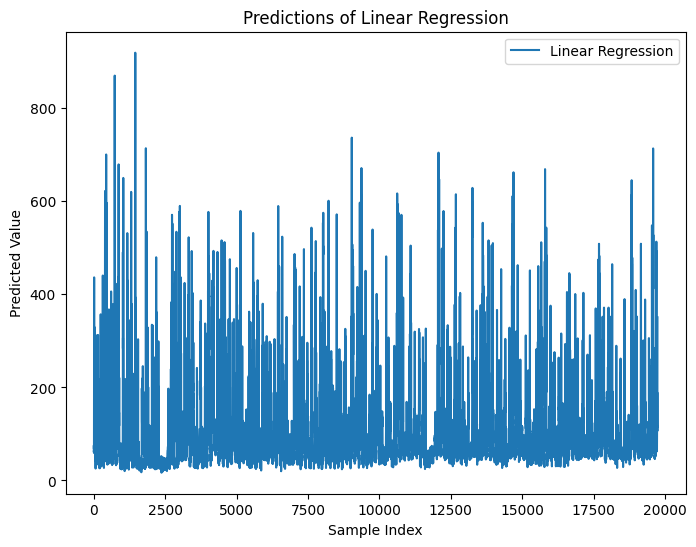

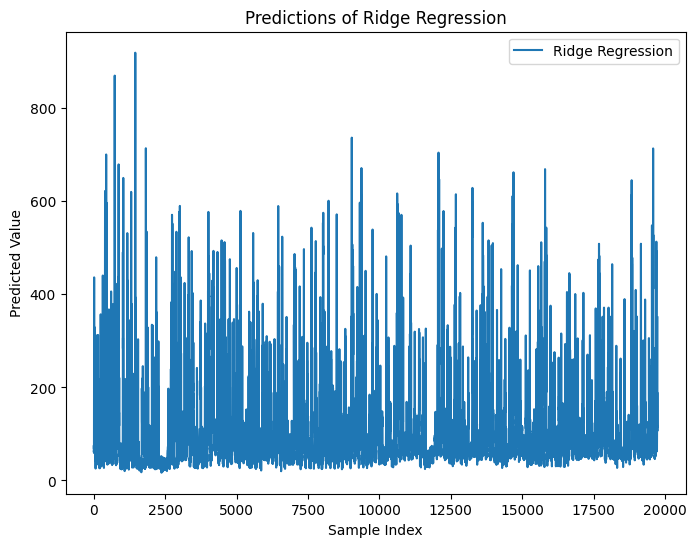

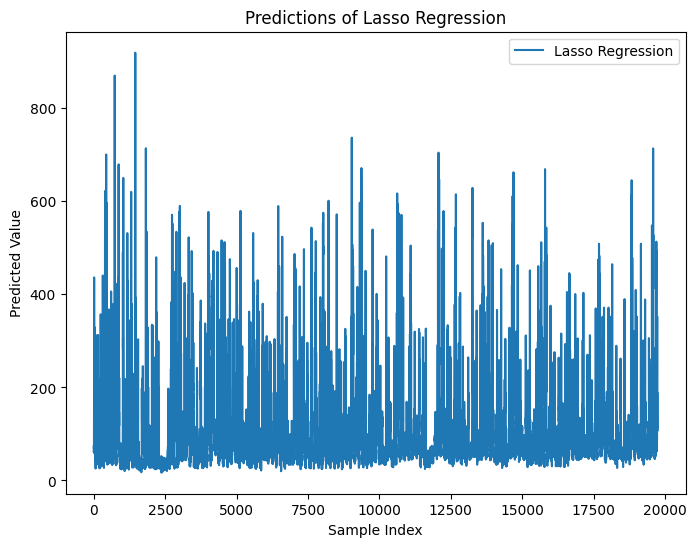

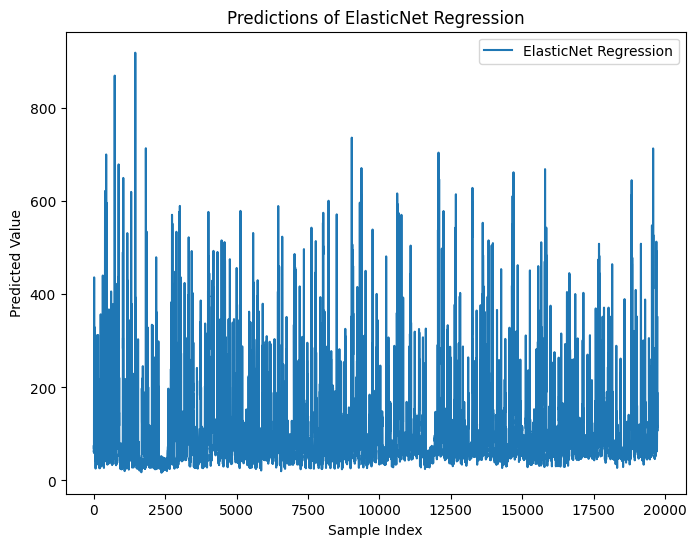

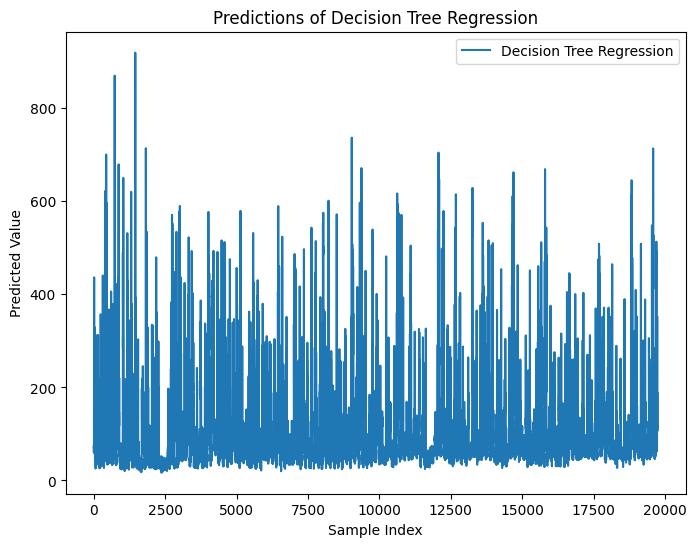

...

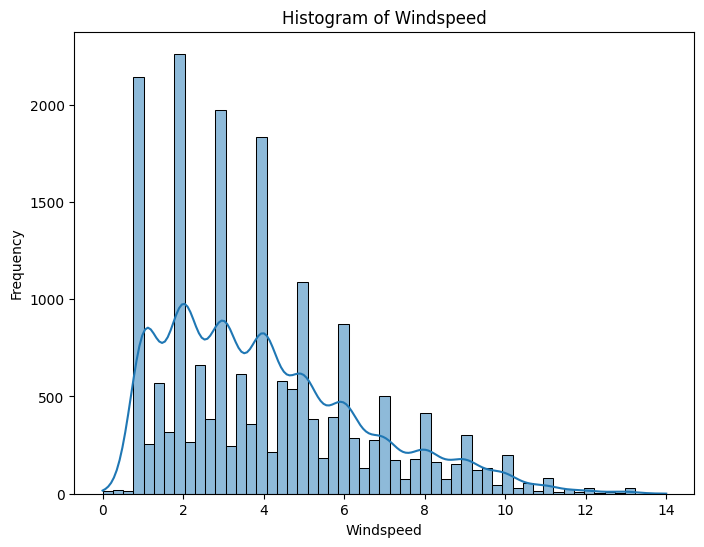

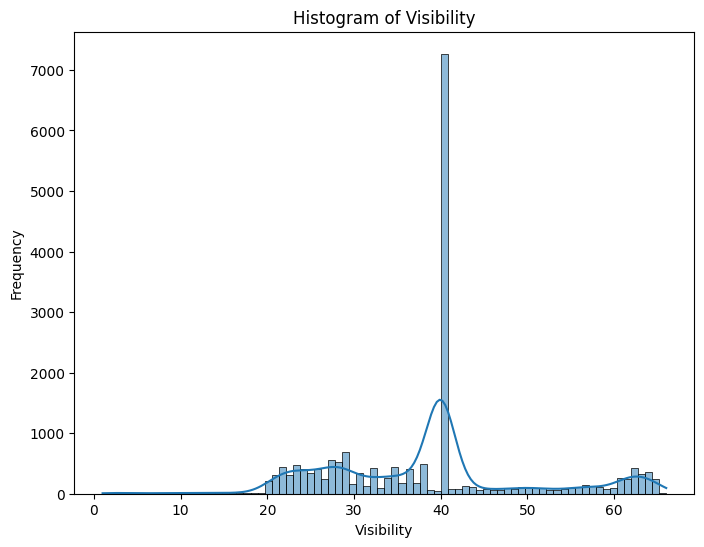

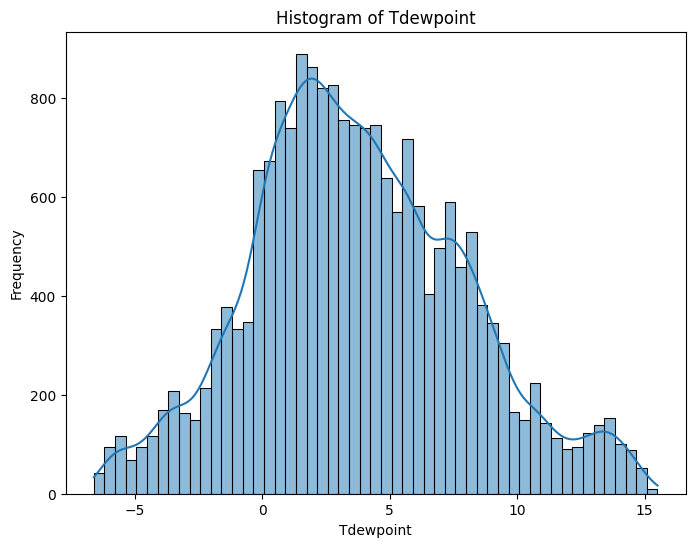

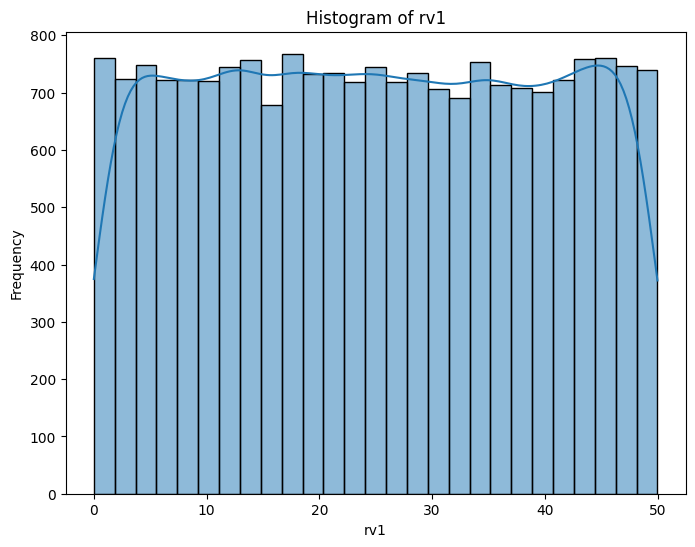

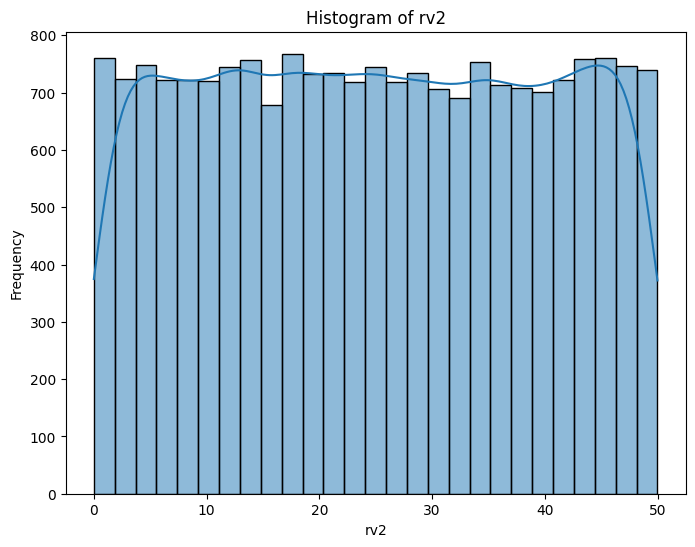

In [17]:

class AnalysisAndVisualizationPrediction:
    def __init__(self):
        self.dataset = EnergyDataProcessor('/content/energydata_complete.csv').load_data()
        self.model_selection = ModelSelection()
        self.predictions = {}
        self.X = self.dataset.drop(columns=["Appliances", "date"])
        self.y = self.dataset["Appliances"]

    def train_models(self):
        self.model_selection.train_split()
        self.model_selection.train_models()

    def evaluate_models(self):
        self.model_selection.evaluate_models()

    def tune_hyperparameters(self):
        self.model_selection.tune_hyperparameters()

    def compare_models(self):
        best_model, _ = self.model_selection.compare_models()
        self.best_model = self.model_selection.models[best_model][0]

    def deploy_model(self):
        # Ensure self.X has only the selected features used during training
        X_deploy = self.X[self.model_selection.X_train.columns]

        predictions = self.best_model.predict(X_deploy)
        self.predictions = {model_name: predictions for model_name, (_, _) in self.model_selection.models.items()}

    def descriptive_statistics(self):
        return self.dataset.describe()

    def visualize_correlation_analysis(self):
        numeric_columns = self.dataset.select_dtypes(include=['float64', 'int64']).columns
        corr_matrix = self.dataset[numeric_columns].corr()
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
        plt.title('Correlation Matrix')
        plt.show()

    def feature_importance(self):
        importance = self.model_selection.feature_importance(self.X, self.y)
        return importance

    def domain_knowledge_based_analysis(self):
        # Ensure index is datetime
        self.dataset.index = pd.to_datetime(self.dataset.index)

        # Analyze energy consumption patterns based on domain knowledge
        # Example 1: Energy consumption by month
        energy_by_month = self.dataset.groupby(self.dataset.index.month)['Appliances'].mean()

        # Example 2: Energy consumption by season
        seasons = ['Winter', 'Spring', 'Summer', 'Autumn']
        month_to_season = {1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer',
                           7: 'Summer', 8: 'Summer', 9: 'Autumn', 10: 'Autumn', 11: 'Autumn', 12: 'Winter'}
        energy_by_season = self.dataset.groupby(self.dataset.index.month.map(month_to_season))['Appliances'].mean()

        # Example 3: Energy consumption by time of day and day of week
        energy_by_hour_dayofweek = self.dataset.groupby([self.dataset.index.hour, self.dataset.index.dayofweek])['Appliances'].mean().unstack()

        # Example 4: Energy consumption by temperature
        temp_bins = pd.cut(self.dataset['T_out'], bins=range(-10, 40, 5), right=False)
        energy_by_temperature = self.dataset.groupby(temp_bins)['Appliances'].mean()

        return energy_by_month, energy_by_season, energy_by_hour_dayofweek, energy_by_temperature, seasons, month_to_season, temp_bins

    def visualize_descriptive_statistics(self):
        numeric_columns = self.dataset.select_dtypes(include=['float64', 'int64']).columns
        descriptive_stats = self.dataset[numeric_columns].describe()
        # Plotting histograms for each numerical column
        for column in self.dataset.columns:
            if self.dataset[column].dtype != 'object':
                plt.figure(figsize=(8, 6))
                sns.histplot(self.dataset[column], kde=True)
                plt.title(f'Histogram of {column}')
                plt.xlabel(column)
                plt.ylabel('Frequency')
                plt.show()

    def visualize_correlation_analysis(self):
        corr_matrix = self.correlation_analysis()
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
        plt.title('Correlation Matrix')
        plt.show()

    def visualize_feature_importance(self):
        feature_importance = self.feature_importance()
        plt.figure(figsize=(10, 6))
        sns.barplot(x=feature_importance.values, y=feature_importance.index)
        plt.title('Feature Importance')
        plt.xlabel('Importance')
        plt.ylabel('Features')
        plt.show()

    def visualize_domain_knowledge_based_analysis(self):
        energy_by_month, energy_by_season, energy_by_hour_dayofweek, energy_by_temperature, seasons, month_to_season, temp_bins = self.domain_knowledge_based_analysis()
        plt.figure(figsize=(8, 6))
        energy_by_month.plot(kind='bar', color='skyblue')
        plt.xlabel('Month')
        plt.ylabel('Average Energy Consumption')
        plt.title('Energy Consumption by Month')
        plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
        plt.grid(True)
        plt.show()

        # Example 2: Energy consumption by season
        plt.figure(figsize=(8, 6))
        energy_by_season.reindex(seasons).plot(kind='bar', color='lightgreen')
        plt.xlabel('Season')
        plt.ylabel('Average Energy Consumption')
        plt.title('Energy Consumption by Season')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.show()

        # Example 3: Energy consumption by time of day and day of week
        plt.figure(figsize=(12, 6))
        sns.heatmap(energy_by_hour_dayofweek, cmap='YlGnBu')
        plt.xlabel('Day of Week')
        plt.ylabel('Hour of Day')
        plt.title('Energy Consumption by Hour of Day and Day of Week')
        plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
        plt.yticks(rotation=0)
        plt.show()

        # Example 4: Energy consumption by temperature
        plt.figure(figsize=(8, 6))
        energy_by_temperature.plot(kind='line', marker='o', color='orange')
        plt.xlabel('Outdoor Temperature (°C)')
        plt.ylabel('Average Energy Consumption')
        plt.title('Energy Consumption by Outdoor Temperature')
        plt.grid(True)
        plt.show()

    def visualize_predictions(self):
        for model_name, predictions in self.predictions.items():
            plt.figure(figsize=(8, 6))
            plt.plot(predictions, label=model_name)
            plt.title(f'Predictions of {model_name}')
            plt.xlabel('Sample Index')
            plt.ylabel('Predicted Value')
            plt.legend()
            plt.show()

    def visualize_original_vs_predicted(self):
        plt.figure(figsize=(10, 6))
        plt.plot(self.dataset.index, self.dataset['Appliances'], label='Original', color='blue')
        for model_name, predictions in self.predictions.items():
            plt.plot(self.dataset.index, predictions, label=f'Predicted ({model_name})', linestyle='--')
        plt.title('Original vs Predicted Energy Consumption')
        plt.xlabel('Time')
        plt.ylabel('Energy Consumption')
        plt.legend()
        plt.show()

    def classify_models(self):
        # Sort models based on performance
        performance = {}
        for model_name, predictions in self.predictions.items():
            # Check if lengths match
            if len(self.model_selection.y_test) != len(predictions):
                print(f"Lengths of y_test ({len(self.model_selection.y_test)}) and predictions ({len(predictions)}) do not match for model {model_name}.")
                continue  # Skip this model if lengths do not match

            mse = mean_squared_error(self.model_selection.y_test, predictions)
            performance[model_name] = mse

        # Sort models based on MSE (ascending)
        sorted_performance = sorted(performance.items(), key=lambda x: x[1])

        return sorted_performance


# Example usage
analysis = AnalysisAndVisualizationPrediction()
analysis.train_models()
analysis.compare_models()  # Determine the best model
analysis.deploy_model()   # Deploy the best model for predictions
analysis.visualize_predictions()
analysis.visualize_domain_knowledge_based_analysis()
analysis.visualize_descriptive_statistics()
analysis.visualize_original_vs_predicted()  # Visualize original vs predicted
# analysis.classify_models()
# analysis.visualize_feature_importance()
# analysis.visualize_correlation_analysis()
analysis.visualize_descriptive_statistics()



# **Analysis And Visualization Prediction Class**

1. **Initialization (`__init__` method)**:
   - The class is initialized with a dataset loaded from a CSV file (`/content/energydata_complete.csv`) using `EnergyDataProcessor`, and stores it in `self.dataset`.
   - `self.model_selection` is initialized as an instance of `ModelSelection`, which handles model training and selection.
   - `self.predictions` is initialized as an empty dictionary to store predictions made by different models.
   - `self.X` is defined as all columns of `self.dataset` except "Appliances" and "date", serving as input features for training.
   - `self.y` contains the target variable "Appliances" from the dataset.

2. **Training Models (`train_models` method)**:
   - Calls `self.model_selection.train_split()` to split the dataset into training and testing sets.
   - Invokes `self.model_selection.train_models()` to train multiple machine learning models on the training data.

3. **Evaluating Models (`evaluate_models` method)**:
   - Utilizes `self.model_selection.evaluate_models()` to evaluate the performance of trained models using metrics such as Mean Squared Error (MSE).

4. **Tuning Hyperparameters (`tune_hyperparameters` method)**:
   - Applies hyperparameter tuning to optimize model performance using cross-validation and `GridSearchCV` through `self.model_selection.tune_hyperparameters()`.

5. **Comparing Models (`compare_models` method)**:
   - Determines the best-performing model by calling `self.model_selection.compare_models()`.
   - Sets `self.best_model` to the top-performing model selected from the comparison.

6. **Deploying Model (`deploy_model` method)**:
   - Prepares `X_deploy` by selecting only the relevant features used during training from `self.X`.
   - Uses `self.best_model` to make predictions on `X_deploy` and stores these predictions in `self.predictions`.

7. **Descriptive Statistics (`descriptive_statistics` method)**:
   - Computes and returns descriptive statistics (mean, std, min, max) for numerical columns in `self.dataset` using `self.dataset.describe()`.

8. **Visualizing Correlation Analysis (`visualize_correlation_analysis` method)**:
   - Generates a heatmap using `seaborn.heatmap()` to visualize the correlation matrix of numerical features in `self.dataset`.

9. **Feature Importance (`feature_importance` method)**:
   - Computes and returns feature importance scores based on the best model's analysis using `self.model_selection.feature_importance(self.X, self.y)`.

10. **Domain Knowledge Based Analysis (`domain_knowledge_based_analysis` method)**:
    - Sets the index of `self.dataset` as datetime.
    - Analyzes energy consumption patterns based on domain knowledge:
      - Computes average energy consumption by month.
      - Groups months into seasons and calculates average energy consumption per season.
      - Analyzes energy consumption by hour of day and day of week.
      - Computes average energy consumption based on outdoor temperature bins.

11. **Visualizing Descriptive Statistics (`visualize_descriptive_statistics` method)**:
    - Generates histograms using `seaborn.histplot()` for each numerical column in `self.dataset` to visualize their distributions.

12. **Visualizing Domain Knowledge Based Analysis (`visualize_domain_knowledge_based_analysis` method)**:
    - Plots various analyses derived from domain knowledge:
      - Bar plot of average energy consumption by month.
      - Bar plot of average energy consumption by season.
      - Heatmap of energy consumption by hour of day and day of week.
      - Line plot of energy consumption by outdoor temperature.

13. **Visualizing Predictions (`visualize_predictions` method)**:
    - Iterates through `self.predictions` to plot predictions made by different models against the sample index using `matplotlib.pyplot.plot()`.

14. **Visualizing Original vs Predicted (`visualize_original_vs_predicted` method)**:
    - Plots the original energy consumption values (`self.dataset['Appliances']`) against predictions made by different models stored in `self.predictions` over time.

15. **Classifying Models (`classify_models` method)**:
    - Evaluates the performance of each model based on Mean Squared Error (MSE) between predictions and `self.model_selection.y_test`.
    - Ranks models in ascending order of MSE and returns the sorted list of model performances.

This class integrates data loading, preprocessing, model training, evaluation, hyperparameter tuning, and comprehensive visualization to analyze and predict energy consumption patterns effectively.
